# Продвинутое глубокое обучение и обучение с подкреплением: ДЗ №3

**Булаев Владимир, группа DS-32**

Примечание:
- Для решения всех проблем с отображением выложил файл на nbviewer
- Ссылка на оригинальный файл в репозитории: https://github.com/bulaevvi/Advanced-ML/blob/main/AdvancedRL_DL_HW3.ipynb

## Содержание: <a class="anchor" id="zero-bullet"></a>
* [Часть I. Перенос стиля при помощи pix2pix](#I)
    * [1. Реализация pix2pix](#1)
    * [2. Обучение pix2pix](#2)
* [Часть II: Перенос стиля при помощи CycleGAN](#II)
    * [3. Реализация CycleGAN](#3)
    * [4. Обучение CycleGAN](#4)

In [24]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import itertools

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.autograd import Variable
from torchvision.utils import save_image
from PIL import Image
import torchvision.datasets as datasets
from torchvision.utils import make_grid

FIG_SIZE = (14, 8)

In [2]:
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

train_path = './facades/train'
test_path  = './facades/test'

BATCH_SIZE = 40

In [15]:
transform = transforms.Compose([transforms.Resize(256),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))])

class dataset(torch.utils.data.Dataset):
    def __init__(self, file_dir, transform=None):
        self.file_dir = file_dir
        self.file_list = [x for x in sorted(os.listdir(self.file_dir))]
        self.transform = transform
        
    def __len__(self):
        self.filelength = len(self.file_list)
        return self.filelength
    
    def __getitem__(self,idx):
        img_path = os.path.join(self.file_dir,self.file_list[idx])
        img = Image.open(img_path)
        input = img.crop((img.width // 2, 0, img.width, img.height))
        target = img.crop((0, 0, img.width // 2, img.height))
        if self.transform is not None:
            input = self.transform(input)
            target = self.transform(target)
        return input, target
    
train_data = dataset(train_path, transform = transform)
test_data  = dataset(test_path, transform = transform)

train_data_loader = torch.utils.data.DataLoader(dataset = train_data, batch_size = BATCH_SIZE, shuffle = True)
test_data_loader  = torch.utils.data.DataLoader(dataset = test_data,  batch_size = BATCH_SIZE, shuffle = False)

def plot_losses(loss, title):
    plt.figure(figsize = FIG_SIZE)
    plt.plot(loss)
    plt.title(title)
    plt.xlabel('Iteration over batch')
    plt.ylabel('Loss')

## Часть I. Перенос стиля при помощи pix2pix <a class="anchor" id="I"></a>  

**Описание задачи:** 
В этом задании мы будем реализовывать перенос стиля на спаренных данных (paired data). Из стандартных датасетов я выбрал самый маленький - давайте реализуем перенос стиля из масок сегментации в “настоящие фотографии” для конкретного случая фасадов домов.

Датасет можно скачать здесь: http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz
 (и во многих других местах, должно быть ~29 мегабайт).  

Подразумевается реализация pix2pix архитектуры, т.е. генератора и дискриминатора, которые получают на вход условие в виде изображения исходного стиля.  

[К содержанию](#zero-bullet) 

### 1. Реализация pix2pix <a class="anchor" id="1"></a>  

In [5]:
class ConvBlock(torch.nn.Module):
    def __init__(self, input_size, output_size, kernel_size=4, stride=2, padding=1, activation=True, batchnorm=True):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(input_size, output_size, kernel_size, stride, padding)
        self.activation = activation
        self.lrelu = nn.LeakyReLU(0.2, True)
        self.batchnorm = batchnorm
        self.bn = nn.BatchNorm2d(output_size)

    def forward(self, x):
        out = self.conv(self.lrelu(x)) if self.activation else self.conv(x)
        result = self.bn(out) if self.batchnorm else out
        return result
    
class DeconvBlock(torch.nn.Module):
    def __init__(self, input_size, output_size, kernel_size=4, stride=2, padding=1, batchnorm = True, dropout=False):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(input_size, output_size, kernel_size, stride, padding)
        self.bn = nn.BatchNorm2d(output_size)
        self.dropout = nn.Dropout(0.5)
        self.relu = nn.ReLU(True)
        self.batchnorm = batchnorm
        self.isdropout = dropout

    def forward(self, x):
        out = self.bn(self.deconv(self.relu(x))) if self.batchnorm else self.deconv(self.relu(x))
        result = self.dropout(out) if self.isdropout else out
        return result

In [6]:
class Generator(torch.nn.Module):
    def __init__(self, input_dim, num_filter, output_dim):
        super(Generator, self).__init__()
        # Encoder
        self.conv1 = ConvBlock(input_dim, num_filter, activation=False, batchnorm=False)
        self.conv2 = ConvBlock(num_filter, num_filter * 2)
        self.conv3 = ConvBlock(num_filter * 2, num_filter * 4)
        self.conv4 = ConvBlock(num_filter * 4, num_filter * 8)
        self.conv5 = ConvBlock(num_filter * 8, num_filter * 8)
        self.conv6 = ConvBlock(num_filter * 8, num_filter * 8)
        self.conv7 = ConvBlock(num_filter * 8, num_filter * 8)
        self.conv8 = ConvBlock(num_filter * 8, num_filter * 8, batchnorm=False, activation=False) 
        # Decoder
        self.deconv1 = DeconvBlock(num_filter * 8, num_filter * 8, dropout=True)
        self.deconv2 = DeconvBlock(num_filter * 8 * 2, num_filter * 8, dropout=True)
        self.deconv3 = DeconvBlock(num_filter * 8 * 2, num_filter * 8, dropout=True)
        self.deconv4 = DeconvBlock(num_filter * 8 * 2, num_filter * 8)
        self.deconv5 = DeconvBlock(num_filter * 8 * 2, num_filter * 4)
        self.deconv6 = DeconvBlock(num_filter * 4 * 2, num_filter * 2)
        self.deconv7 = DeconvBlock(num_filter * 2 * 2, num_filter)
        self.deconv8 = DeconvBlock(num_filter * 2, output_dim, batchnorm=False)

    def forward(self, x):
        enc1 = self.conv1(x)
        enc2 = self.conv2(enc1)
        enc3 = self.conv3(enc2)
        enc4 = self.conv4(enc3)
        enc5 = self.conv5(enc4)
        enc6 = self.conv6(enc5)
        enc7 = self.conv7(enc6)
        enc8 = self.conv8(enc7)

        dec1 = self.deconv1(enc8)
        dec1 = torch.cat([dec1, enc7], 1)
        dec2 = self.deconv2(dec1)
        dec2 = torch.cat([dec2, enc6], 1)
        dec3 = self.deconv3(dec2)
        dec3 = torch.cat([dec3, enc5], 1)
        dec4 = self.deconv4(dec3)
        dec4 = torch.cat([dec4, enc4], 1)
        dec5 = self.deconv5(dec4)
        dec5 = torch.cat([dec5, enc3], 1)
        dec6 = self.deconv6(dec5)
        dec6 = torch.cat([dec6, enc2], 1)
        dec7 = self.deconv7(dec6)
        dec7 = torch.cat([dec7, enc1], 1)
        dec8 = self.deconv8(dec7)
        out = torch.nn.Tanh()(dec8)
        return out

    def normal_weight_init(self, mean=0.0, std=0.02):
        for m in self.children():
            if isinstance(m, ConvBlock):
                nn.init.normal(m.conv.weight, mean, std)
            if isinstance(m, DeconvBlock):
                nn.init.normal(m.deconv.weight, mean, std)

In [7]:
class Discriminator(torch.nn.Module):
    def __init__(self, input_dim, num_filter, output_dim):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(
            ConvBlock(input_dim, num_filter, activation=False, batchnorm=False),
            ConvBlock(num_filter, num_filter * 2),
            ConvBlock(num_filter * 2, num_filter * 4),
            ConvBlock(num_filter * 4, num_filter * 8, stride=1),
            ConvBlock(num_filter * 8, output_dim, stride=1, batchnorm=False))

    def forward(self, x, label):
        x = torch.cat([x, label], 1)
        x = self.discriminator(x)
        out = nn.Sigmoid()(x)
        return out

    def normal_weight_init(self, mean=0.0, std=0.02):
        for m in self.children():
            if isinstance(m, ConvBlock):
                nn.init.normal(m.conv.weight, mean, std)

[К содержанию](#zero-bullet) 

### 2. Обучение pix2pix <a class="anchor" id="2"></a>

In [13]:
def do_pix2pix_epoch(input, target, i, device):
    x = Variable(input.to(device))
    y = Variable(target.to(device))
    
    d_real_decision = discriminator(x, y).squeeze()
    real_data = Variable(torch.ones(d_real_decision.size()).to(device))
    d_real_loss = BCE_loss(d_real_decision, real_data)

    gen_image = generator(x)
    d_fake_decision = discriminator(x, gen_image).squeeze()
    fake = Variable(torch.zeros(d_fake_decision.size()).to(device))
    d_fake_loss = BCE_loss(d_fake_decision, fake)

    d_loss = (d_real_loss + d_fake_loss) * 0.5
    discriminator.zero_grad()
    d_loss.backward()
    d_optimizer.step()

    gen_image = generator(x)
    d_fake_decision = discriminator(x, gen_image).squeeze()
    g_fake_loss = BCE_loss(d_fake_decision, real_data)

    g_loss = g_fake_loss + 100 * L1_loss(gen_image, y)
    generator.zero_grad()
    g_loss.backward()
    g_optimizer.step()

    return gen_image, d_loss, g_loss

def train(dataloader, device, do_epoch = None, num_epochs=10, sample_dir="./output", generate_every = 200):
    d_losses, g_losses = [], []
    for epoch in range(num_epochs):
        for i, (imgs, targets) in enumerate(dataloader):
            gen_imgs, d_loss, g_loss = do_epoch(imgs, targets, i, device)
            if d_loss is not None and g_loss is not None:
                d_losses.append(d_loss.item())
                g_losses.append(g_loss.item())
            batches_done = epoch * len(dataloader) + i
            if batches_done % generate_every == 0:
                print("Epoch %d/%d batch %d/%d D loss: %.6f G loss: %.6f" % \
                      (epoch, num_epochs, i, len(dataloader), d_losses[-1], g_losses[-1]))
                save_image(gen_imgs.data[:25], "%s/%05d.png" % (sample_dir, batches_done), nrow=5, normalize=True)
    return d_losses, g_losses

In [10]:
generator = Generator(3, 64, 3)
discriminator = Discriminator(6, 64, 1)
generator.to(DEVICE)
discriminator.to(DEVICE)
  
generator.normal_weight_init(mean=0.0, std=0.02)
discriminator.normal_weight_init(mean=0.0, std=0.02)

BCE_loss = nn.BCELoss().to(DEVICE)
L1_loss = nn.L1Loss().to(DEVICE)

lr_g, lr_d, beta1, beta2 = 0.0002, 0.0002, 0.5, 0.999
g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(beta1, beta2))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))

<ipython-input-6-fcdf66b62e20>:54: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  nn.init.normal(m.conv.weight, mean, std)
<ipython-input-6-fcdf66b62e20>:56: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  nn.init.normal(m.deconv.weight, mean, std)


In [11]:
d_losses, g_losses = train(train_data_loader, DEVICE, do_pix2pix_epoch, num_epochs = 400, sample_dir = './output')

Epoch 0/400 batch 0/10 D loss: 0.709240 G loss: 42.013336
Epoch 20/400 batch 0/10 D loss: 0.177610 G loss: 25.637539
Epoch 40/400 batch 0/10 D loss: 0.645715 G loss: 19.657341
Epoch 60/400 batch 0/10 D loss: 0.874525 G loss: 17.707983
Epoch 80/400 batch 0/10 D loss: 0.454336 G loss: 16.399191
Epoch 100/400 batch 0/10 D loss: 0.595773 G loss: 14.732279
Epoch 120/400 batch 0/10 D loss: 0.526611 G loss: 14.452140
Epoch 140/400 batch 0/10 D loss: 0.457111 G loss: 13.210774
Epoch 160/400 batch 0/10 D loss: 0.486372 G loss: 11.690780
Epoch 180/400 batch 0/10 D loss: 0.446523 G loss: 11.442096
Epoch 200/400 batch 0/10 D loss: 0.626433 G loss: 13.037405
Epoch 220/400 batch 0/10 D loss: 0.472144 G loss: 10.365984
Epoch 240/400 batch 0/10 D loss: 0.531402 G loss: 10.113577
Epoch 260/400 batch 0/10 D loss: 0.600779 G loss: 10.345854
Epoch 280/400 batch 0/10 D loss: 0.603199 G loss: 9.855768
Epoch 300/400 batch 0/10 D loss: 0.541340 G loss: 8.994350
Epoch 320/400 batch 0/10 D loss: 0.685717 G loss

Изначально было указано 200 эпох обучения. При этом были получены следующие графики:

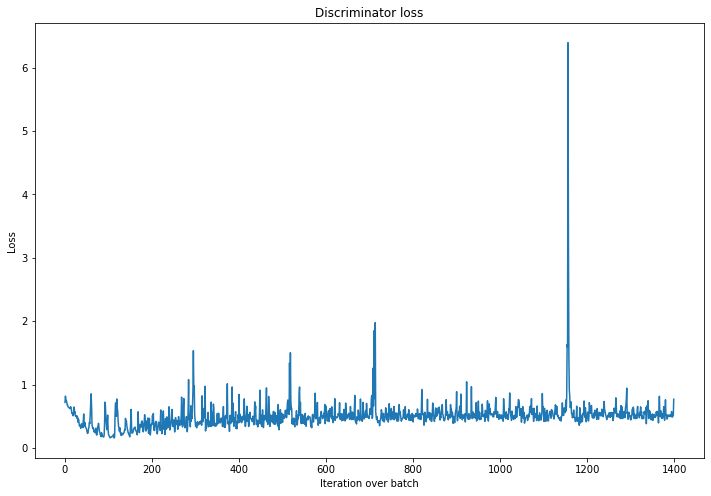

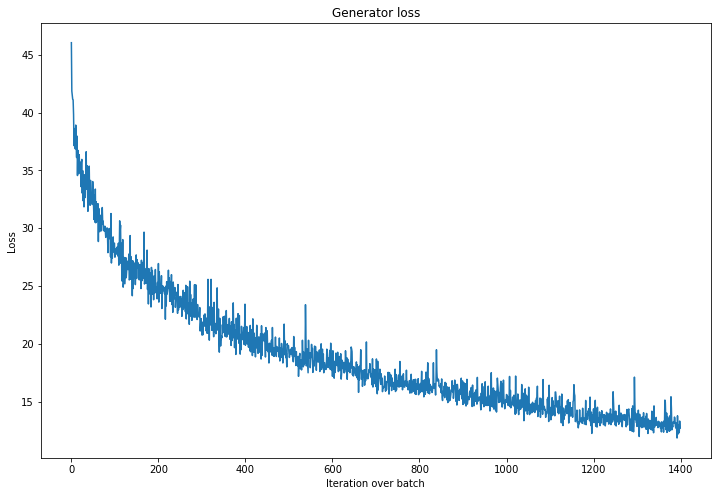

In [11]:
plot_losses(d_losses_200_epoch, 'Discriminator loss')
plot_losses(g_losses_200_epoch, 'Generator loss')

Судя по характеру кривой обучения, на 200 эпохах (1400 итераций по батчам) Generator loss еще не вышел на плато. Поэтому код обучения был запущен повторно с уменьшенным до 40 размером батча и количеством эпох 400 (всего 4000 итераций по батчам)

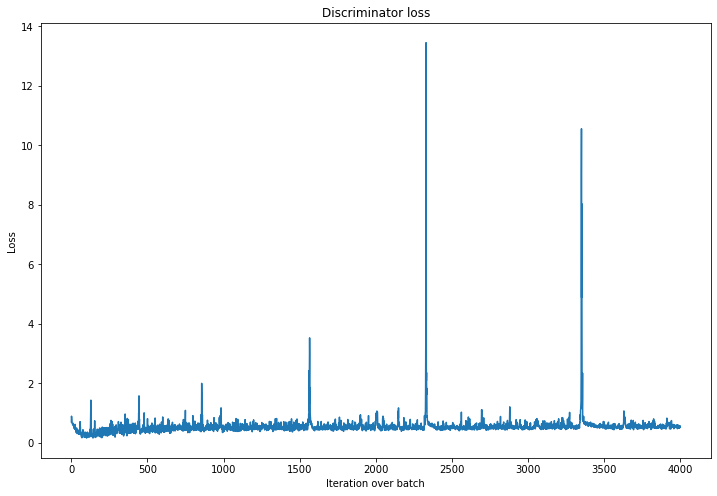

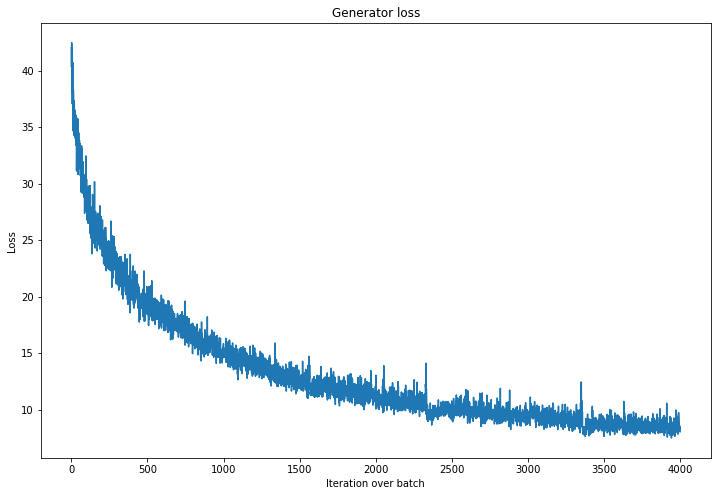

In [14]:
plot_losses(d_losses, 'Discriminator loss')
plot_losses(g_losses, 'Generator loss')

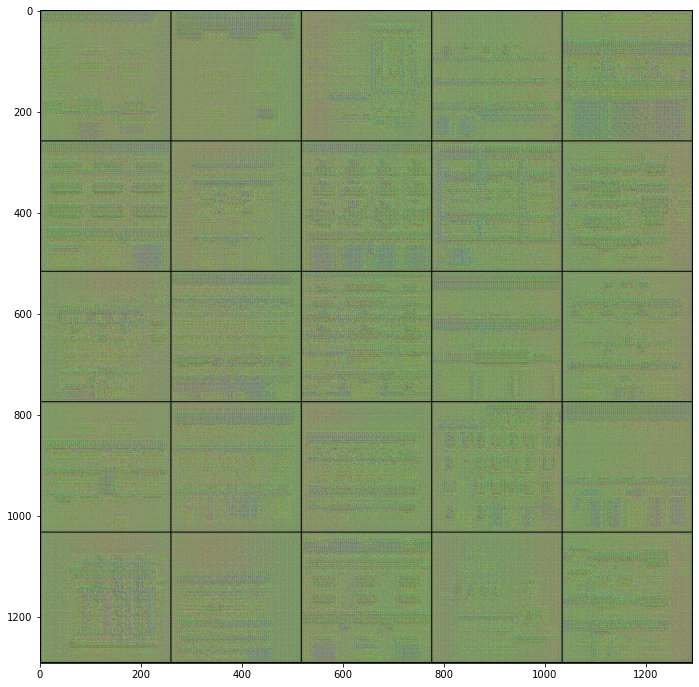

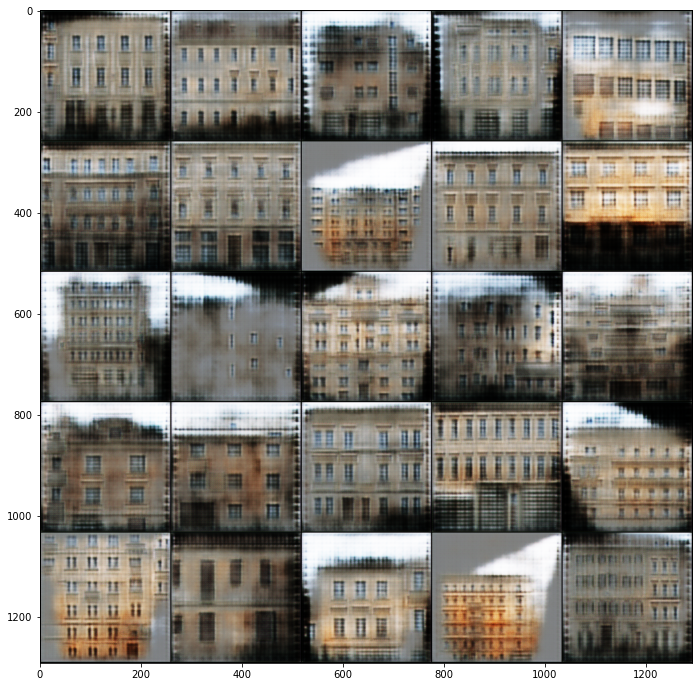

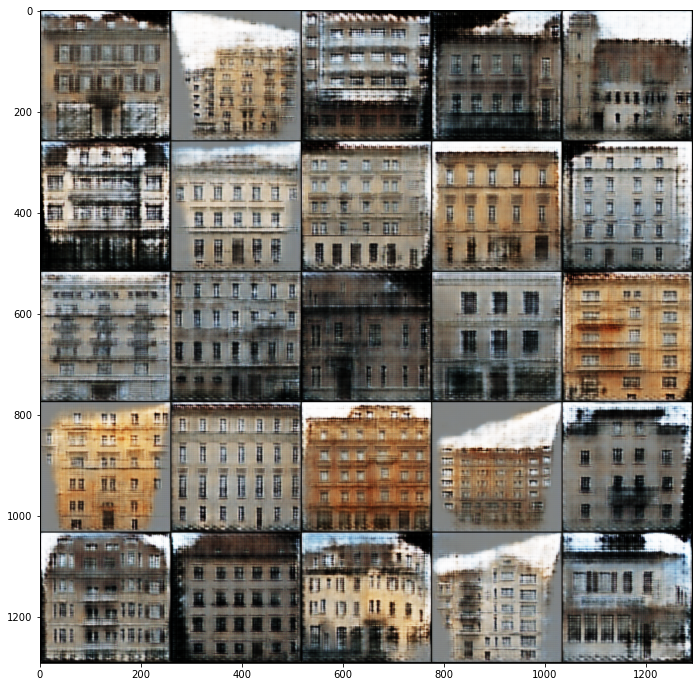

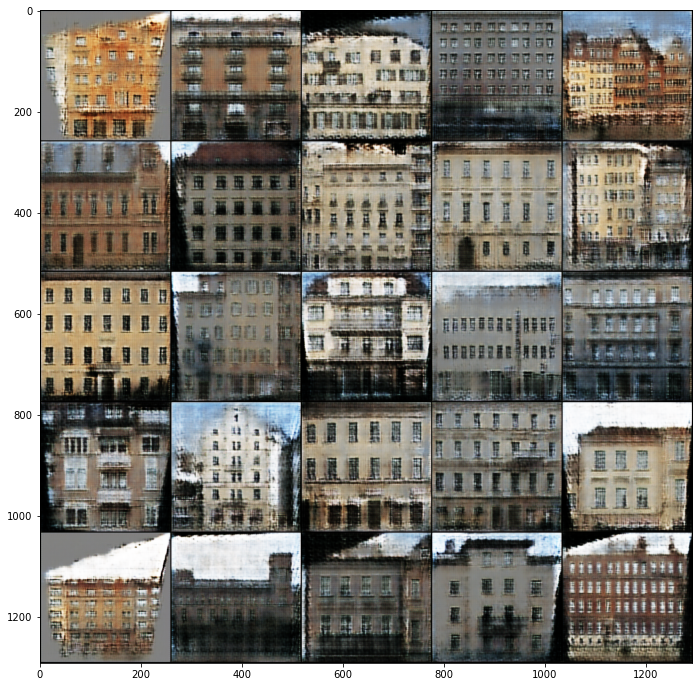

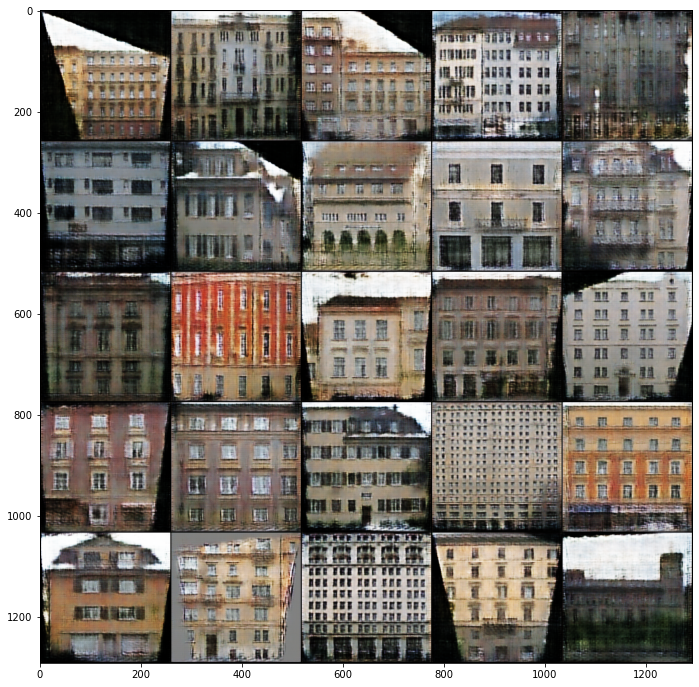

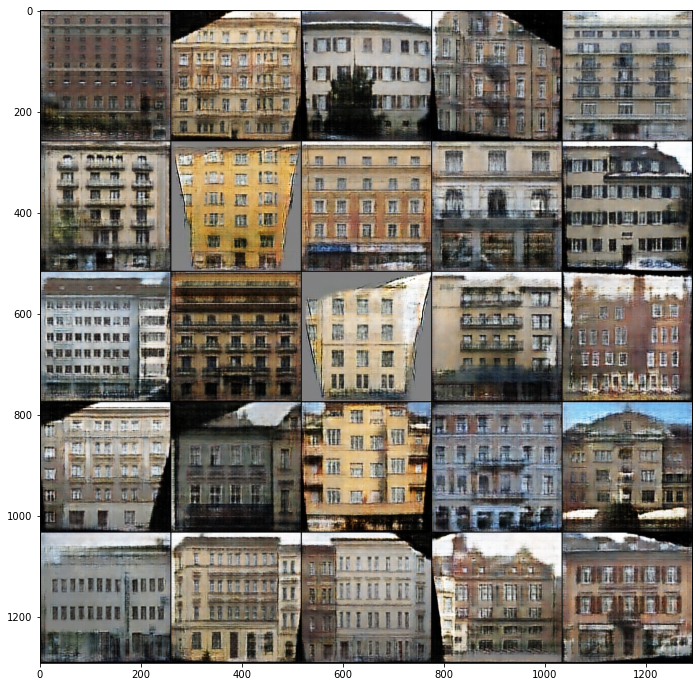

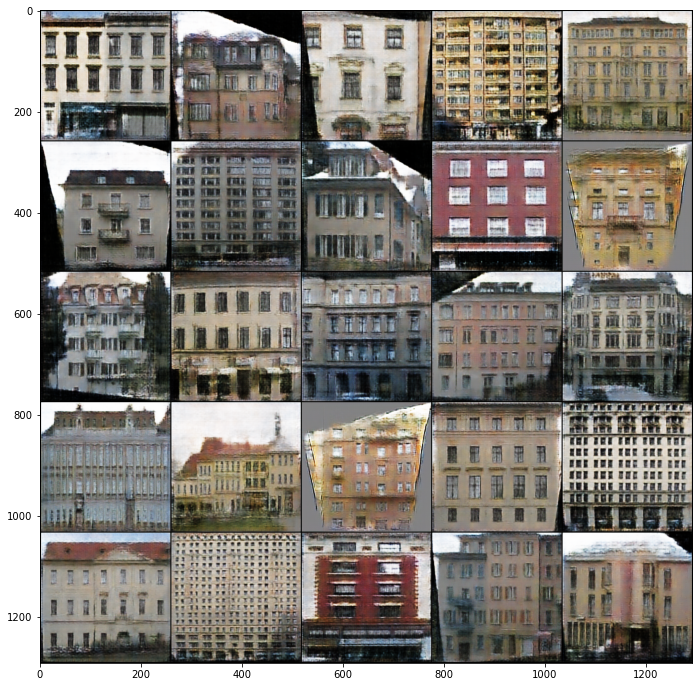

In [30]:
sample_dir = './output'
for i in range(0, 1400, 200):
    img_path = "%s/%05d.png" % (sample_dir, i)
    sample_image = Image.open(img_path)
    plt.figure(figsize = (12, 12))
    plt.imshow(sample_image) 
plt.show()

[К содержанию](#zero-bullet) 

**Выводы по части I:**  
1) Loss у дискриминатора сначала падает, потом возрастает и далее стабилизируется около значения 0.5.  
2) Loss генератора со временем падает с выходом на асимптотическое значение.  
3) Количество итераций обучения оказывает существенное влияние на качество генерируемой картинки.  
4) В целом при достаточном количестве итераций pix2pix достигает неплохих результатов.  

[К содержанию](#zero-bullet) 

## Часть II: Перенос стиля при помощи CycleGAN <a class="anchor" id="II"></a>  

Условие задачи: *Вторая часть - реализация CycleGAN. Предлагается на том же датасете реализовать базовую конструкцию CycleGAN для unpaired style transfer, то есть переноса стилей, каждый из которых задан неразмеченным датасетом.*

### 3. Реализация CycleGAN <a class="anchor" id="3"></a>  

In [4]:
class CycleConvBlock(torch.nn.Module):
    def __init__(self, input_size, output_size, kernel_size=4, stride=2, padding=1, activation=True, batchnorm=True):
        super(CycleConvBlock, self).__init__()
        self.conv = nn.Conv2d(input_size, output_size, kernel_size, stride, padding)
        self.activation = activation
        self.lrelu = nn.LeakyReLU(0.2, True)
        self.batchnorm = batchnorm
        self.inorm = nn.InstanceNorm2d(output_size)

    def forward(self, x):
        out = self.conv(self.lrelu(x)) if self.activation else self.conv(x)
        result = self.inorm(out) if self.batchnorm else out
        return result
    
class CycleDiscriminator(torch.nn.Module):
    def __init__(self):
        super(CycleDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, padding=1),
        )

    def forward(self, x):
        x = self.model(x)
        x = F.avg_pool2d(x, x.size()[2:])
        x = torch.flatten(x, 1)
        return x

In [5]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()

        self.res = nn.Sequential(nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels),
                                 nn.ReLU(inplace=True),
                                 nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels))

    def forward(self, x):
        return x + self.res(x)
    
class CycleGenerator(nn.Module):
    def __init__(self):
        super(CycleGenerator, self).__init__()
        self.model = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(3, 64, 7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True),

            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),

            nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ReflectionPad2d(3),
            nn.Conv2d(64, 3, 7),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)

In [7]:
class CycleDataset(torch.utils.data.Dataset):
    def __init__(self, file_dir, transform=None, unpaired = True):
        self.file_dir = file_dir
        self.file_list = [x for x in sorted(os.listdir(self.file_dir))]
        self.transform = transform
        self.unpaired = unpaired
    
    def __len__(self):
        self.filelength = len(self.file_list)
        return self.filelength
    
    def __getitem__(self,idx):
        img_path = os.path.join(self.file_dir,self.file_list[idx])
        img = Image.open(img_path)

        input = img.crop((img.width // 2, 0, img.width, img.height))

        if self.unpaired:
            idx1 = random.randint(0, len(self.file_list) - 1)
            img_path = os.path.join(self.file_dir,self.file_list[idx1])
            img = Image.open(img_path)

        target = img.crop((0, 0, img.width // 2, img.height))

        if self.transform is not None:
            input = self.transform(input)
            target = self.transform(target)

        return input, target

In [8]:
class ReplayBuffer:
    def __init__(self, max_size = 50):
        assert (max_size > 0), "Empty buffer!"
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

[К содержанию](#zero-bullet) 
### 4. Обучение CycleGAN <a class="anchor" id="4"></a>

In [9]:
BATCH_SIZE = 10
transform = transforms.Compose([transforms.Resize(128),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))])

train_cycle_data = CycleDataset(train_path, transform = transform, unpaired = True)
train_cycle_data_loader = torch.utils.data.DataLoader(dataset = train_cycle_data, batch_size = BATCH_SIZE, shuffle=True)

In [10]:
def train_cycle(dataloader, device, do_epoch=None, num_epochs=10, sample_dir='./output', generate_every=100):
    g_losses = []
    d_losses = []

    identity_losses = []
    gan_losses = []
    cycle_losses = []

    fake_A_buffer = ReplayBuffer(10)
    fake_B_buffer = ReplayBuffer(10)

    for epoch in range(num_epochs):
        for i, (imgs, targets) in enumerate(dataloader):
            identity_loss, gan_loss, cycle_loss, _, fake_imgs, _ = do_cycle_epoch(imgs, targets, i, device, fake_A_buffer, fake_B_buffer)
            if identity_loss is not None and gan_loss is not None and cycle_loss is not None:
                identity_losses.append(identity_loss)
                gan_losses.append(gan_loss)
                cycle_losses.append(cycle_loss)
            batches_done = epoch * len(dataloader) + i
            if batches_done % generate_every == 0:
                print("Epoch %d/%d batch %d/%d identity loss: %.6f gan loss: %.6f cycle loss: %.6f" % \
                      (epoch, num_epochs, i, len(dataloader), identity_losses[-1], gan_losses[-1], cycle_losses[-1]))
                save_image(fake_imgs.data[:5], "%s/%05d.png" % (sample_dir, batches_done), nrow=5, normalize=True)
    return identity_losses, gan_losses, cycle_losses

In [11]:
def do_cycle_epoch(A, B, i, device, fake_A_buffer, fake_B_buffer):
    real_image_A = A.to(device)
    real_image_B = B.to(device)
    batch_size = real_image_A.size(0)

    real_label = torch.full((batch_size, 1), 1, device=device, dtype=torch.float32)
    fake_label = torch.full((batch_size, 1), 0, device=device, dtype=torch.float32)

    optimizer_G.zero_grad()

    identity_image_A = generatorB2A(real_image_A)
    loss_identity_A = identity_loss(identity_image_A, real_image_A) * 5.0

    identity_image_B = generatorA2B(real_image_B)
    loss_identity_B = identity_loss(identity_image_B, real_image_B) * 5.0

    fake_image_A = generatorB2A(real_image_B)
    fake_output_A = discriminatorA(fake_image_A)
    loss_GAN_B2A = adversarial_loss(fake_output_A, real_label)

    fake_image_B = generatorA2B(real_image_A)
    fake_output_B = discriminatorB(fake_image_B)
    loss_GAN_A2B = adversarial_loss(fake_output_B, real_label)

    recovered_image_A = generatorB2A(fake_image_B)
    loss_cycle_ABA = cycle_loss(recovered_image_A, real_image_A) * 10.0

    recovered_image_B = generatorA2B(fake_image_A)
    loss_cycle_BAB = cycle_loss(recovered_image_B, real_image_B) * 10.0

    errG = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB

    errG.backward()
    optimizer_G.step()

    optimizer_D_A.zero_grad()

    real_output_A = discriminatorA(real_image_A)
    errD_real_A = adversarial_loss(real_output_A, real_label)

    fake_image_A = fake_A_buffer.push_and_pop(fake_image_A)
    fake_output_A = discriminatorA(fake_image_A.detach())
    errD_fake_A = adversarial_loss(fake_output_A, fake_label)

    errD_A = (errD_real_A + errD_fake_A) / 2
    errD_A.backward()
    optimizer_D_A.step()

    optimizer_D_B.zero_grad()
    real_output_B = discriminatorB(real_image_B)
    errD_real_B = adversarial_loss(real_output_B, real_label)

    fake_image_B = fake_B_buffer.push_and_pop(fake_image_B)
    fake_output_B = discriminatorB(fake_image_B.detach())
    errD_fake_B = adversarial_loss(fake_output_B, fake_label)

    errD_B = (errD_real_B + errD_fake_B) / 2

    errD_B.backward()
    optimizer_D_B.step()

    loss_G_identity = (loss_identity_A + loss_identity_B).item()
    loss_G_GAN = (loss_GAN_A2B + loss_GAN_B2A).item()
    loss_G_cycle = (loss_cycle_ABA + loss_cycle_BAB).item()

    fake_image_A = 0.5 * (generatorB2A(real_image_B).data + 1.0)
    fake_image_B = 0.5 * (generatorA2B(real_image_A).data + 1.0)
    torch.cuda.empty_cache()
    return loss_G_identity, loss_G_GAN, loss_G_cycle, fake_image_A, fake_image_B, fake_output_B

In [12]:
generatorA2B = CycleGenerator().to(DEVICE)
generatorB2A = CycleGenerator().to(DEVICE)
discriminatorA = CycleDiscriminator().to(DEVICE)
discriminatorB = CycleDiscriminator().to(DEVICE)

generatorA2B.apply(weights_init)
generatorB2A.apply(weights_init)
discriminatorA.apply(weights_init)
discriminatorB.apply(weights_init)

cycle_loss = nn.L1Loss().to(DEVICE)
identity_loss = nn.L1Loss().to(DEVICE)
adversarial_loss = nn.MSELoss().to(DEVICE)
lr = 0.0002
optimizer_G = torch.optim.Adam(itertools.chain(generatorA2B.parameters(), generatorB2A.parameters()),
                               lr=lr, betas=(0.5, 0.999))
optimizer_D_A = torch.optim.Adam(discriminatorA.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(discriminatorB.parameters(), lr=lr, betas=(0.5, 0.999))

In [13]:
identity_losses, gan_losses, cycle_losses = train_cycle(train_cycle_data_loader, 
                                                        DEVICE, 
                                                        do_cycle_epoch, 
                                                        num_epochs=200, 
                                                        sample_dir = './output', 
                                                        generate_every=200)

Epoch 0/200 batch 0/40 identity loss: 6.304244 gan loss: 2.798066 cycle loss: 12.566862
Epoch 5/200 batch 0/40 identity loss: 1.447808 gan loss: 0.892034 cycle loss: 3.715248
Epoch 10/200 batch 0/40 identity loss: 1.534099 gan loss: 0.916924 cycle loss: 3.874597
Epoch 15/200 batch 0/40 identity loss: 1.075470 gan loss: 1.509345 cycle loss: 2.531224
Epoch 20/200 batch 0/40 identity loss: 1.069166 gan loss: 2.235190 cycle loss: 2.758095
Epoch 25/200 batch 0/40 identity loss: 1.029665 gan loss: 1.779917 cycle loss: 2.635380
Epoch 30/200 batch 0/40 identity loss: 0.959069 gan loss: 0.553250 cycle loss: 2.347798
Epoch 35/200 batch 0/40 identity loss: 0.976270 gan loss: 1.096512 cycle loss: 2.404663
Epoch 40/200 batch 0/40 identity loss: 0.878208 gan loss: 1.399035 cycle loss: 2.540201
Epoch 45/200 batch 0/40 identity loss: 0.771053 gan loss: 0.871969 cycle loss: 2.028164
Epoch 50/200 batch 0/40 identity loss: 0.808560 gan loss: 0.597604 cycle loss: 2.351788
Epoch 55/200 batch 0/40 identity 

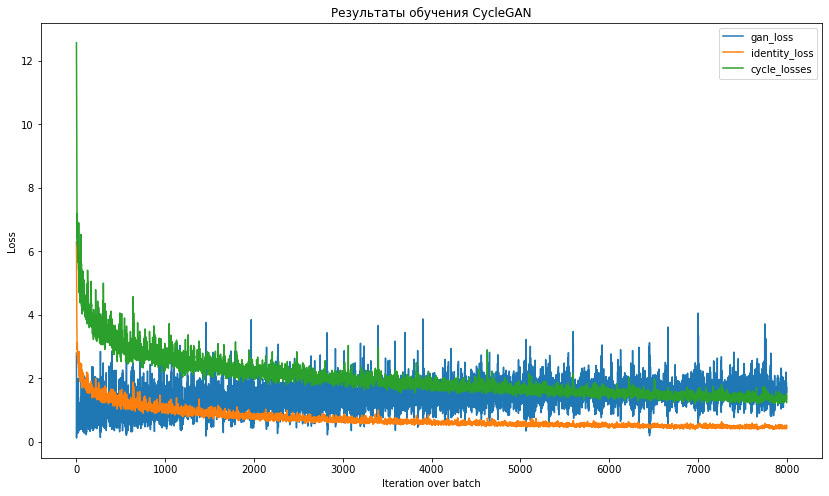

In [23]:
plt.figure(figsize = (14, 8))
plt.plot(gan_losses, label = 'gan_loss')
plt.plot(identity_losses, label = 'identity_loss')
plt.plot(cycle_losses, label = 'cycle_losses')
plt.title('Результаты обучения CycleGAN')
plt.xlabel('Iteration over batch')
plt.ylabel('Loss')
plt.legend()

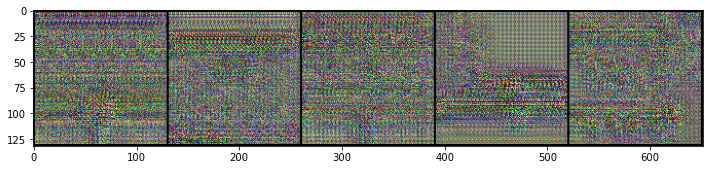

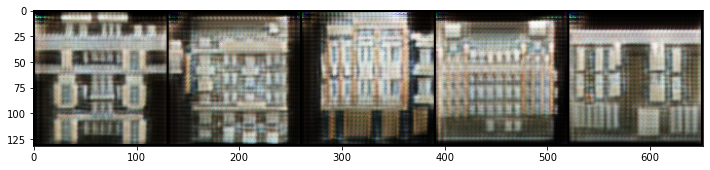

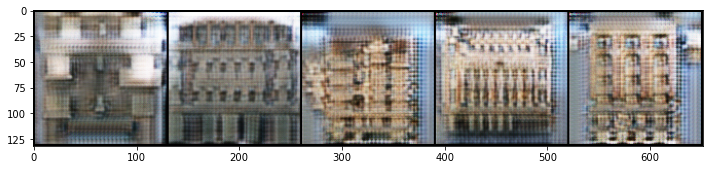

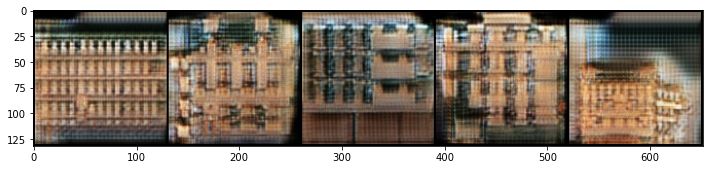

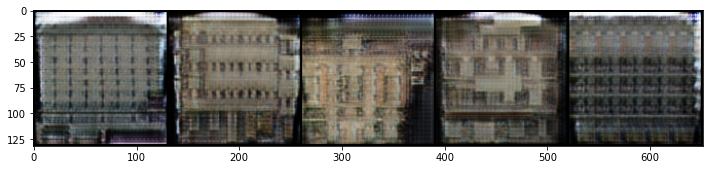

...

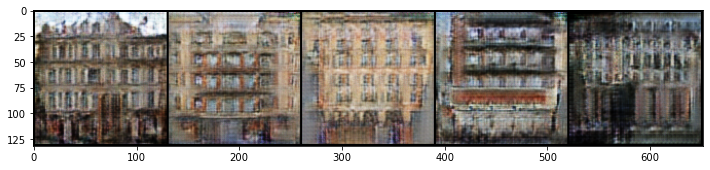

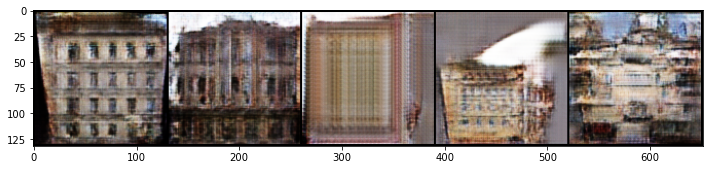

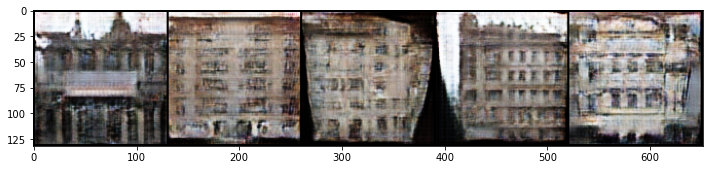

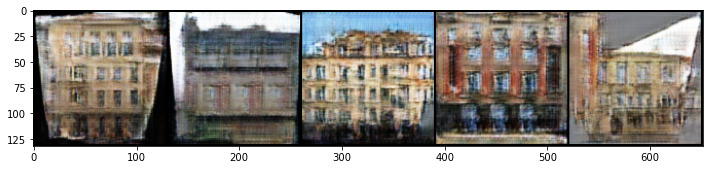

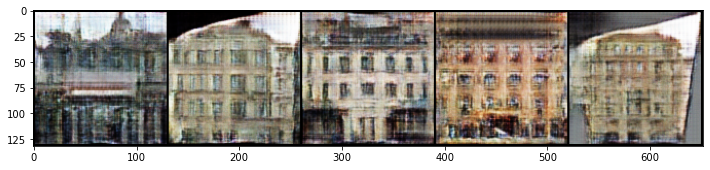

In [18]:
sample_dir = './output'
for i in range(0, 8000, 600):
    img_path = "%s/%05d.png" % (sample_dir, i)
    sample_image = Image.open(img_path)
    plt.figure(figsize = (12, 12))
    plt.imshow(sample_image) 
plt.show()

**Выводы по части II:**  
1) Обе модели обучались локально с использованием видеокарты Nvidia RTX 2070 8 GB (ноутбучный вариант).   
2) Модель CicleGAN гораздо "тяжелее" по сравнению с pix2pix. Для возможности обучения CicleGAN пришлость  уменьшить разрешение изображений с 256 до 128.  
3) Обучение CicleGAN длится примерно в 4-5 раз дольше, чем pix2pix.  
4) Результаты генерации CycleGAN уступают по качеству pix2pix. Возможные причины:  
- CicleGAN - более сложная модель, и ей необходимо гораздо больше данных и эпох для достижения качественного результата.  
- Для обучения CicleGAN использовались картинки с разрешением 128х128 (для pix2pix использовалось разрешение 256х256). Весьма вероятно, что CicleGAN будет показывать более хорошие результаты на изображениях высокого разрешения.

[К содержанию](#zero-bullet) 